# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:16<00:00, 3.74KFile/s] 


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

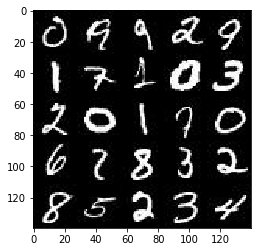

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

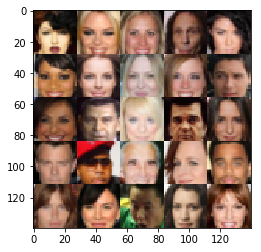

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function

    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real') 
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    
    
    
    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [7]:
alpha = 0.1
dropout = 0.5

In [8]:
def leaky_relu(l):
    return tf.maximum(alpha * l, l)

In [12]:
def discriminator(images, reuse=False):
    with tf.variable_scope('discriminator', reuse=reuse):
        # TODO: Implement Function
        l1 = tf.layers.conv2d(images, 16, 7,strides=2, padding='same')
        l1 = tf.layers.batch_normalization(l1, training=True)
        relu1 = leaky_relu(l1)

        l2 = tf.layers.conv2d(l1, 32,5,strides=2, padding='same')
        l2 = tf.layers.batch_normalization(l2, training=True)
        relu2 = leaky_relu(l2)

        l3 = tf.layers.conv2d(l2, 64,3,strides=2, padding='same')
        l3 = tf.layers.batch_normalization(l3, training=True)
        relu3 = leaky_relu(l3)
        
        l4 = tf.layers.conv2d(l3, 128,1,strides=1, padding='same')
        l4 = tf.layers.batch_normalization(l4, training=True)
        relu4 = leaky_relu(l4)
        l4 = tf.nn.dropout(l4, 0.2)

        # Flatten it
        flat = tf.contrib.layers.flatten(relu3)
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

    return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [29]:
def generator(z, out_channel_dim, is_train=True):

    # TODO: Implement Function
    with tf.variable_scope("generator",reuse = not is_train):
        l1 = tf.layers.dense(z, 7*7*32)
        l1 = tf.layers.batch_normalization(l1, training=is_train)
        l1 = leaky_relu(l1)
        l1 = tf.nn.dropout(l1, dropout)
        l1 = tf.reshape(l1, (-1, 7, 7, 32))
     
        l2 = tf.layers.conv2d_transpose(l1, 16, 3, strides=2, padding='same')
        l2 = tf.layers.batch_normalization(l2, training=is_train)
        l2 = leaky_relu(l2)
        l2 = tf.nn.dropout(l2, dropout)
        
        l2 = tf.layers.conv2d_transpose(l2, 32, 5, strides=2, padding='same')
        l2 = tf.layers.batch_normalization(l2, training=is_train)
        l2 = leaky_relu(l2)
        l2 = tf.nn.dropout(l2, dropout)
        
        l2 = tf.layers.conv2d(l2, 64, 7, strides=1, padding='same')
        l2 = tf.layers.batch_normalization(l2, training=is_train)
        l2 = leaky_relu(l2)
        l2 = tf.nn.dropout(l2, dropout)
        
        #28*28
        l3 = tf.layers.conv2d(l2, 128, 4, strides=1, padding='same')
        l3 = tf.layers.batch_normalization(l3, training=is_train)
        l3 = leaky_relu(l3)
        l3 = tf.nn.dropout(l3, dropout)
        
        l4 = tf.layers.conv2d(l3, 256, 2, strides=1, padding='same')
        l4 = tf.layers.batch_normalization(l4, training=is_train)
        l4 = leaky_relu(l4)
        l4 = tf.nn.dropout(l4, dropout)
        
        l4 = tf.layers.conv2d(l4, 512, 1, strides=1, padding='same')
        l4 = leaky_relu(l4)
        l4 = tf.nn.dropout(l4, dropout)
        
        # Output layer
        logits = tf.layers.conv2d(l4, out_channel_dim, 1, strides=1, padding='same')
        # 28*28
        out = tf.tanh(logits)
    return out
      
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [14]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, True)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*0.9))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)*0.9))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)*0.9))

    d_loss = d_loss_real + d_loss_fake
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [15]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
        
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        # Optimize
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [16]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [17]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    print_every = 100
    
    # TODO: Build Model
    # The inputs
    image_mode = len(data_image_mode)# image channels. works because rgb is 3 characters long and l is one, the respective amount of image channels.
    input_images, input_z, l_rate = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)

    d_loss, g_loss = model_loss(input_images, input_z, data_shape[3])
    d_train, g_train = model_opt(d_loss, g_loss, l_rate, beta1)    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            steps = 0
            for batch_images in get_batches(batch_size):
                batch_images = batch_images * 2
                # TODO: Train Model
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                _ = sess.run(d_train, feed_dict={input_images: batch_images, input_z: batch_z, l_rate: learning_rate})
                _ = sess.run(g_train, feed_dict={input_images: batch_images, input_z: batch_z, l_rate: learning_rate})
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = sess.run(d_loss, {input_z: batch_z, input_images: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z, input_images: batch_images})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    _ = show_generator_output(sess, 16, input_z, data_shape[3], data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.5281... Generator Loss: 1.9143


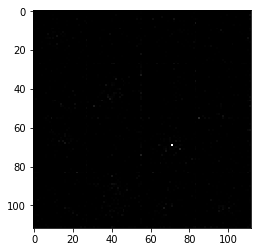

Epoch 1/2... Discriminator Loss: 0.5872... Generator Loss: 1.9656


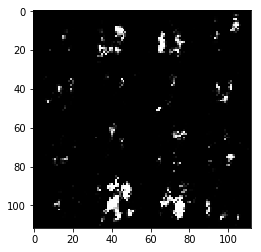

Epoch 1/2... Discriminator Loss: 0.6867... Generator Loss: 2.1542


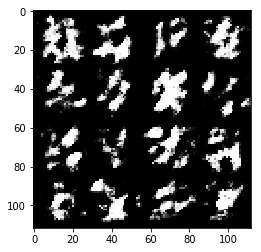

Epoch 1/2... Discriminator Loss: 0.7103... Generator Loss: 1.6489


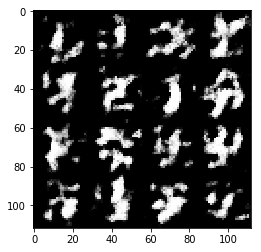

Epoch 1/2... Discriminator Loss: 0.7195... Generator Loss: 1.5342


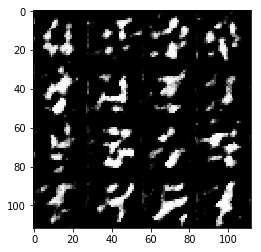

Epoch 1/2... Discriminator Loss: 0.7632... Generator Loss: 1.3903


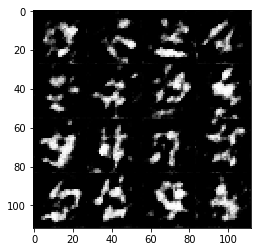

Epoch 1/2... Discriminator Loss: 0.9020... Generator Loss: 1.4788


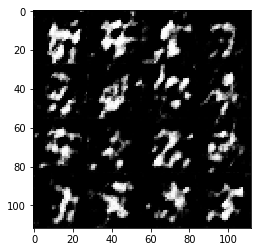

Epoch 1/2... Discriminator Loss: 0.7029... Generator Loss: 1.6504


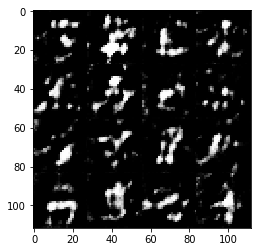

Epoch 1/2... Discriminator Loss: 0.8059... Generator Loss: 1.3238


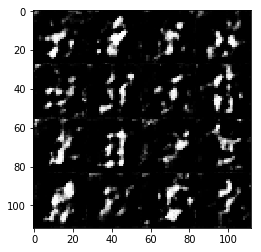

Epoch 1/2... Discriminator Loss: 0.6761... Generator Loss: 1.8756


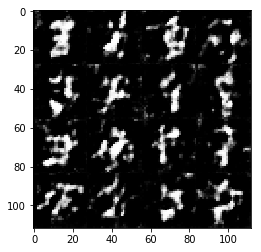

Epoch 1/2... Discriminator Loss: 0.7533... Generator Loss: 1.3615


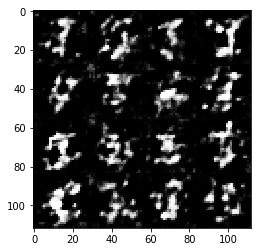

Epoch 1/2... Discriminator Loss: 0.7966... Generator Loss: 1.1443


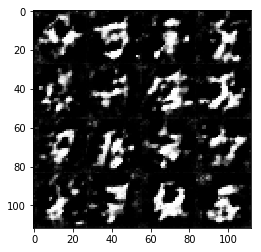

Epoch 1/2... Discriminator Loss: 0.6232... Generator Loss: 1.9678


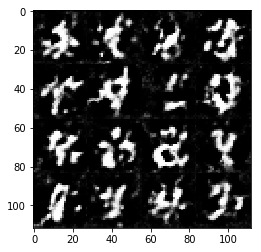

Epoch 1/2... Discriminator Loss: 0.6594... Generator Loss: 1.4230


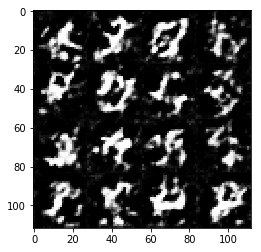

Epoch 1/2... Discriminator Loss: 0.7396... Generator Loss: 1.3247


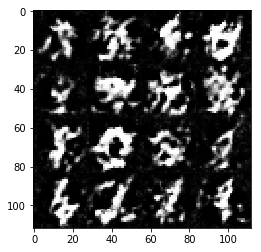

Epoch 1/2... Discriminator Loss: 0.8952... Generator Loss: 1.5192


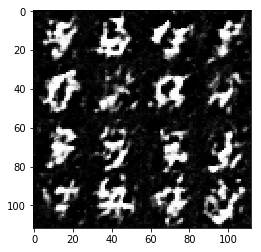

Epoch 1/2... Discriminator Loss: 0.9435... Generator Loss: 1.4721


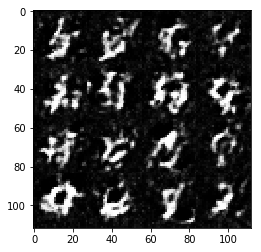

Epoch 1/2... Discriminator Loss: 0.8042... Generator Loss: 1.3792


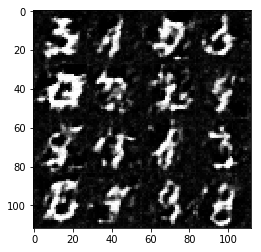

Epoch 1/2... Discriminator Loss: 0.9000... Generator Loss: 1.3801


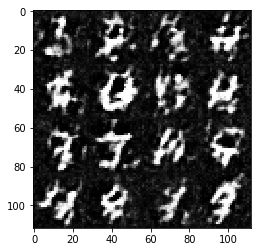

Epoch 1/2... Discriminator Loss: 0.9400... Generator Loss: 1.3072


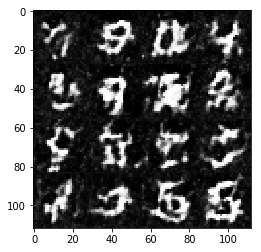

Epoch 1/2... Discriminator Loss: 0.8404... Generator Loss: 1.2546


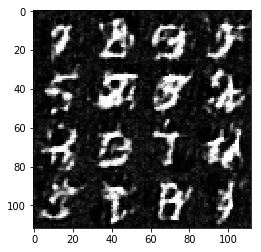

Epoch 1/2... Discriminator Loss: 0.8281... Generator Loss: 1.6915


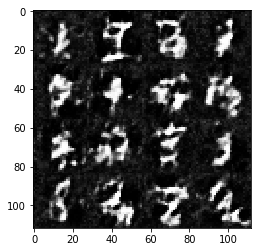

Epoch 1/2... Discriminator Loss: 0.8492... Generator Loss: 1.2658


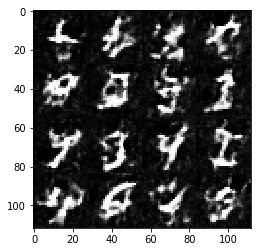

Epoch 1/2... Discriminator Loss: 0.9659... Generator Loss: 1.0861


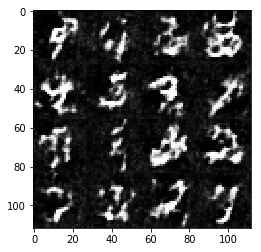

Epoch 1/2... Discriminator Loss: 0.9133... Generator Loss: 1.1111


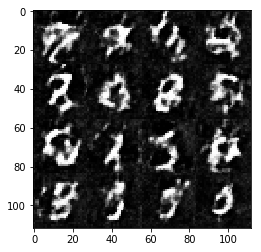

Epoch 1/2... Discriminator Loss: 0.9561... Generator Loss: 1.2556


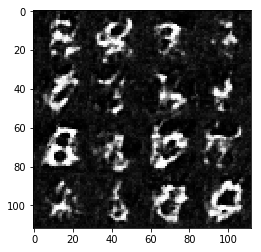

Epoch 1/2... Discriminator Loss: 1.0817... Generator Loss: 1.2510


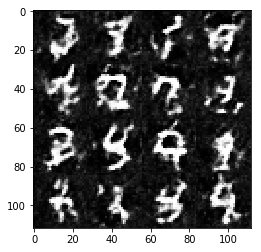

Epoch 1/2... Discriminator Loss: 0.8779... Generator Loss: 1.0761


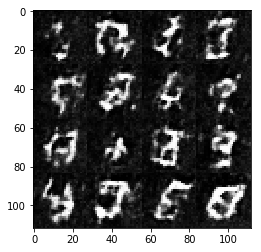

Epoch 1/2... Discriminator Loss: 0.9343... Generator Loss: 1.4283


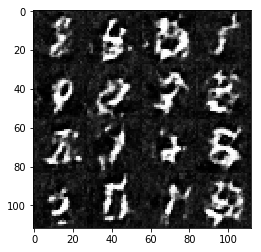

Epoch 1/2... Discriminator Loss: 0.9672... Generator Loss: 1.3382


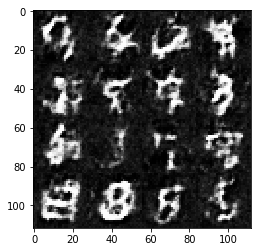

Epoch 1/2... Discriminator Loss: 0.9726... Generator Loss: 1.2823


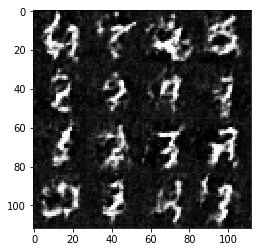

Epoch 1/2... Discriminator Loss: 0.8648... Generator Loss: 1.0587


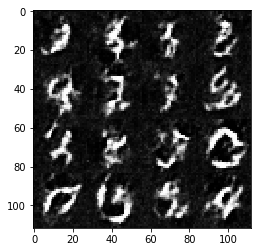

Epoch 1/2... Discriminator Loss: 0.9048... Generator Loss: 1.2276


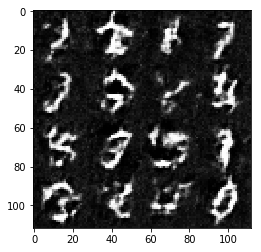

Epoch 1/2... Discriminator Loss: 1.0164... Generator Loss: 1.0474


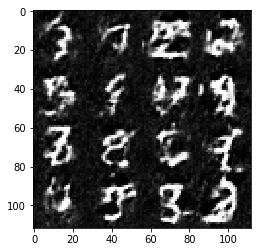

Epoch 1/2... Discriminator Loss: 1.0608... Generator Loss: 1.1355


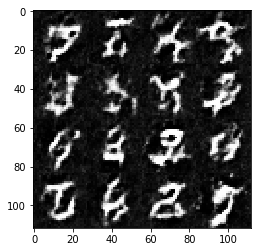

Epoch 1/2... Discriminator Loss: 0.8847... Generator Loss: 1.2029


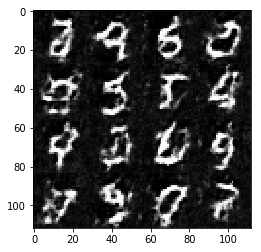

Epoch 1/2... Discriminator Loss: 0.9604... Generator Loss: 1.2645


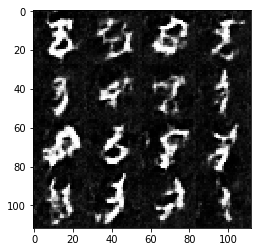

Epoch 2/2... Discriminator Loss: 0.9152... Generator Loss: 1.1848


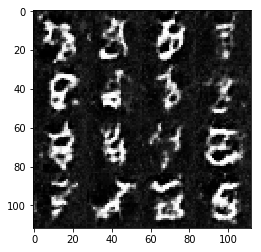

Epoch 2/2... Discriminator Loss: 1.0938... Generator Loss: 1.0807


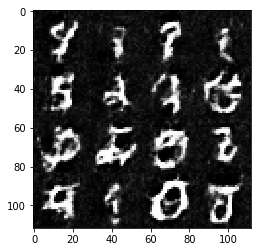

Epoch 2/2... Discriminator Loss: 1.0795... Generator Loss: 1.2997


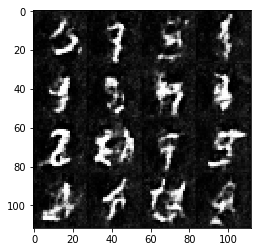

Epoch 2/2... Discriminator Loss: 0.8765... Generator Loss: 1.5789


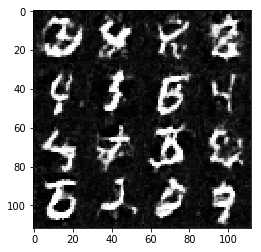

Epoch 2/2... Discriminator Loss: 1.0123... Generator Loss: 1.1619


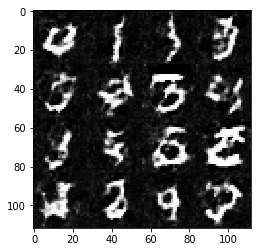

Epoch 2/2... Discriminator Loss: 1.1625... Generator Loss: 1.1717


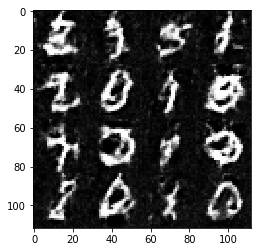

Epoch 2/2... Discriminator Loss: 0.8148... Generator Loss: 1.5396


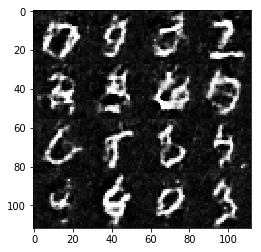

Epoch 2/2... Discriminator Loss: 0.8611... Generator Loss: 1.5736


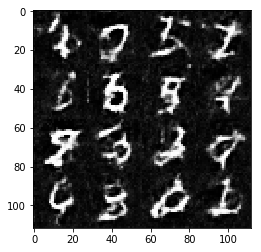

Epoch 2/2... Discriminator Loss: 0.9364... Generator Loss: 1.4288


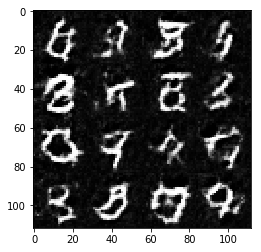

Epoch 2/2... Discriminator Loss: 0.8112... Generator Loss: 1.2364


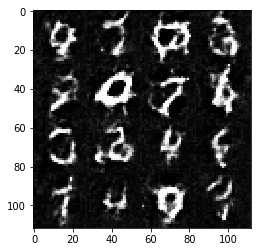

Epoch 2/2... Discriminator Loss: 0.7993... Generator Loss: 1.2033


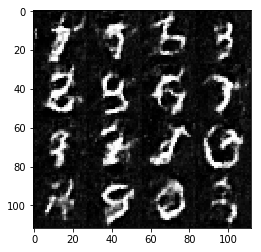

Epoch 2/2... Discriminator Loss: 1.0453... Generator Loss: 1.0385


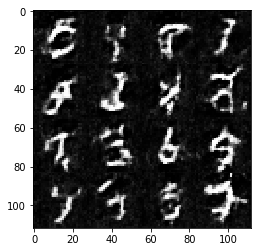

Epoch 2/2... Discriminator Loss: 0.8717... Generator Loss: 1.0255


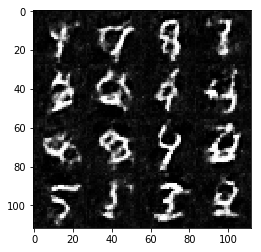

Epoch 2/2... Discriminator Loss: 0.9249... Generator Loss: 1.6343


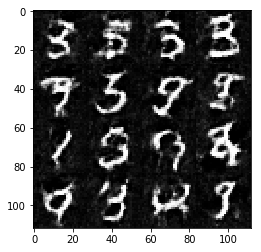

Epoch 2/2... Discriminator Loss: 0.9621... Generator Loss: 1.3069


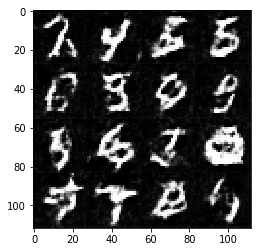

Epoch 2/2... Discriminator Loss: 0.8144... Generator Loss: 1.3145


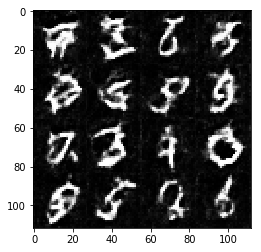

Epoch 2/2... Discriminator Loss: 0.8697... Generator Loss: 1.2643


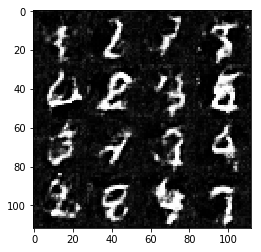

Epoch 2/2... Discriminator Loss: 1.0136... Generator Loss: 1.1877


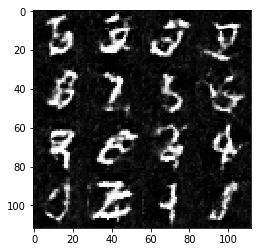

Epoch 2/2... Discriminator Loss: 1.0244... Generator Loss: 1.0696


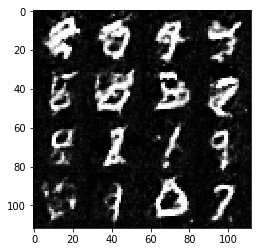

Epoch 2/2... Discriminator Loss: 0.9773... Generator Loss: 1.3630


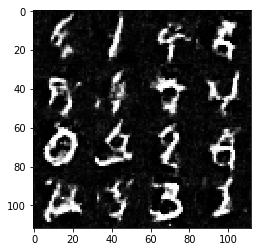

Epoch 2/2... Discriminator Loss: 0.8688... Generator Loss: 1.3237


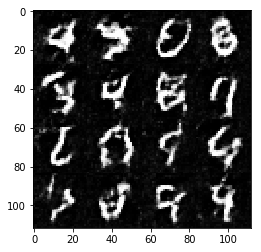

Epoch 2/2... Discriminator Loss: 0.9238... Generator Loss: 1.1640


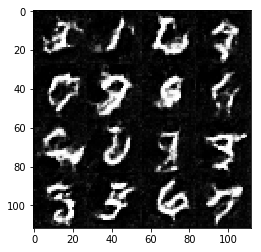

Epoch 2/2... Discriminator Loss: 0.9048... Generator Loss: 1.2467


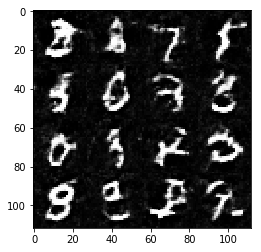

Epoch 2/2... Discriminator Loss: 1.0033... Generator Loss: 1.1730


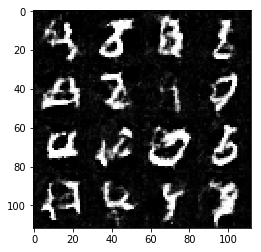

Epoch 2/2... Discriminator Loss: 1.1088... Generator Loss: 1.0683


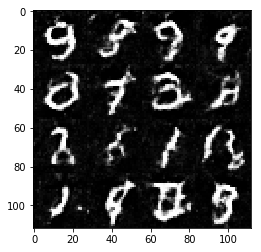

Epoch 2/2... Discriminator Loss: 0.8445... Generator Loss: 1.5028


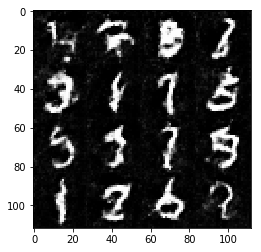

Epoch 2/2... Discriminator Loss: 1.0105... Generator Loss: 1.4182


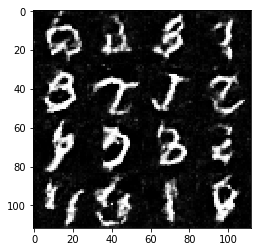

Epoch 2/2... Discriminator Loss: 0.9897... Generator Loss: 1.3171


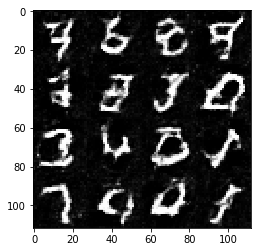

Epoch 2/2... Discriminator Loss: 0.8788... Generator Loss: 1.3805


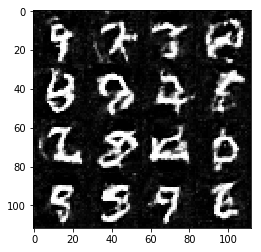

Epoch 2/2... Discriminator Loss: 0.9797... Generator Loss: 1.1003


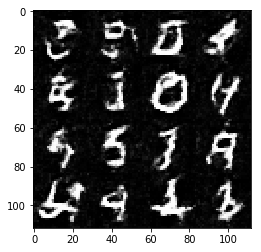

Epoch 2/2... Discriminator Loss: 0.9199... Generator Loss: 1.2018


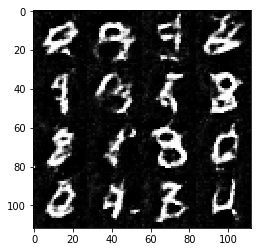

Epoch 2/2... Discriminator Loss: 0.8990... Generator Loss: 1.2321


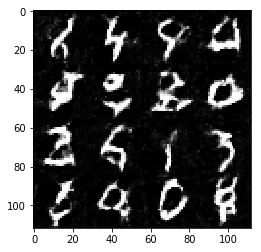

Epoch 2/2... Discriminator Loss: 0.9845... Generator Loss: 1.1007


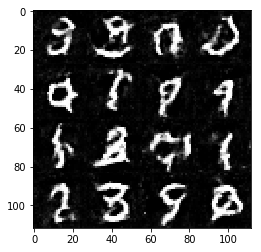

Epoch 2/2... Discriminator Loss: 1.1425... Generator Loss: 1.0551


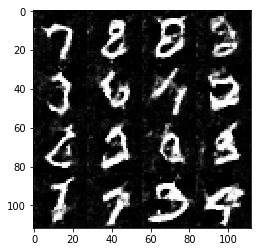

Epoch 2/2... Discriminator Loss: 1.0275... Generator Loss: 1.3866


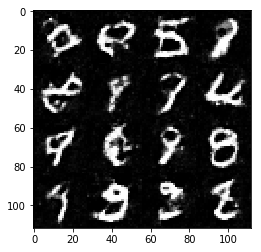

Epoch 2/2... Discriminator Loss: 0.8415... Generator Loss: 0.9954


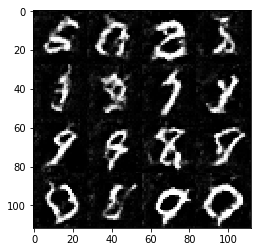

Epoch 2/2... Discriminator Loss: 0.8444... Generator Loss: 1.4616


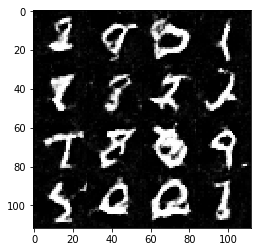

In [30]:
batch_size = 16
z_dim = 100
learning_rate = 0.00025
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 0.4538... Generator Loss: 2.6889


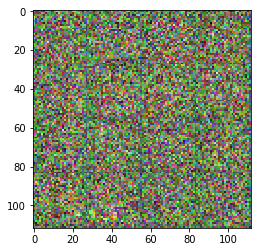

Epoch 1/1... Discriminator Loss: 0.3969... Generator Loss: 3.4817


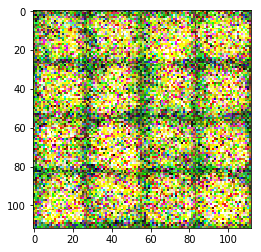

Epoch 1/1... Discriminator Loss: 0.3847... Generator Loss: 3.2927


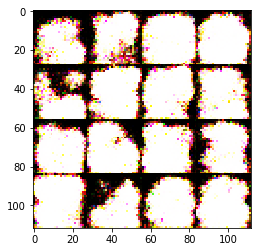

Epoch 1/1... Discriminator Loss: 0.3951... Generator Loss: 3.3372


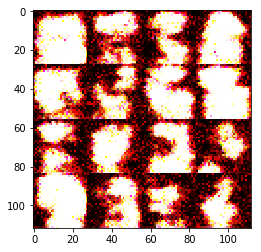

Epoch 1/1... Discriminator Loss: 0.4266... Generator Loss: 2.9868


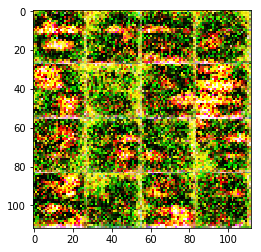

Epoch 1/1... Discriminator Loss: 0.3768... Generator Loss: 4.2009


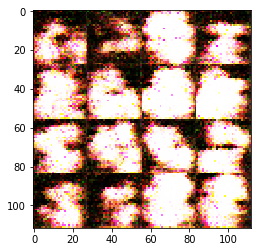

Epoch 1/1... Discriminator Loss: 0.3814... Generator Loss: 3.4478


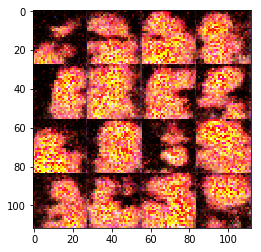

Epoch 1/1... Discriminator Loss: 0.4242... Generator Loss: 3.6766


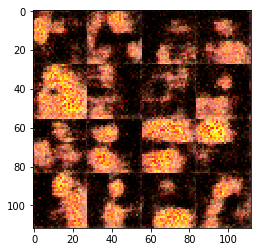

Epoch 1/1... Discriminator Loss: 0.3813... Generator Loss: 3.2819


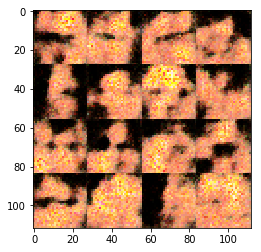

Epoch 1/1... Discriminator Loss: 0.4316... Generator Loss: 3.0469


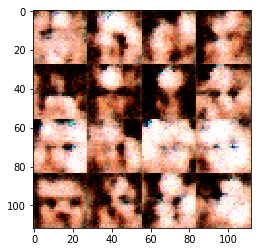

Epoch 1/1... Discriminator Loss: 0.4479... Generator Loss: 2.6576


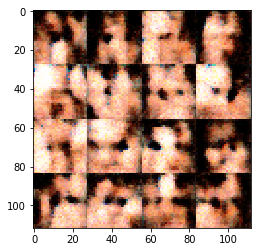

Epoch 1/1... Discriminator Loss: 0.4319... Generator Loss: 3.0001


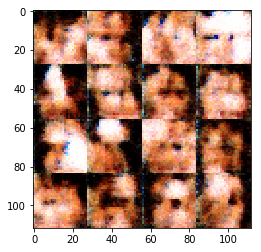

Epoch 1/1... Discriminator Loss: 0.4340... Generator Loss: 3.3933


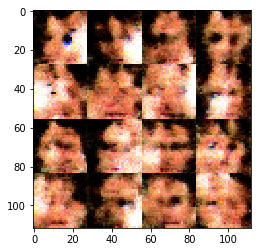

Epoch 1/1... Discriminator Loss: 0.4558... Generator Loss: 2.4717


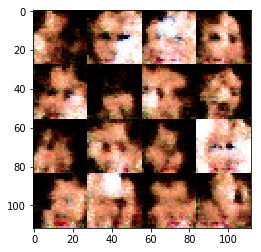

Epoch 1/1... Discriminator Loss: 0.4515... Generator Loss: 2.5767


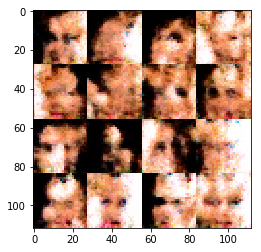

Epoch 1/1... Discriminator Loss: 0.4882... Generator Loss: 2.5692


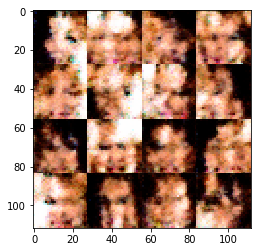

Epoch 1/1... Discriminator Loss: 0.4438... Generator Loss: 2.8899


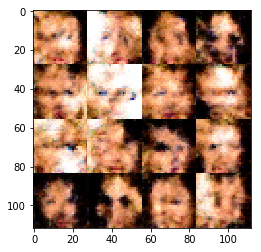

Epoch 1/1... Discriminator Loss: 0.5864... Generator Loss: 1.8564


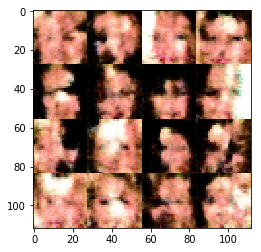

Epoch 1/1... Discriminator Loss: 0.6809... Generator Loss: 1.3468


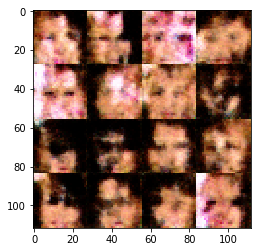

Epoch 1/1... Discriminator Loss: 0.4730... Generator Loss: 1.8289


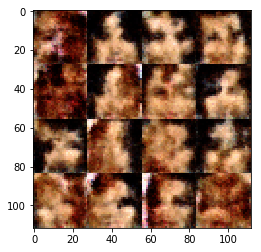

Epoch 1/1... Discriminator Loss: 0.6177... Generator Loss: 1.6259


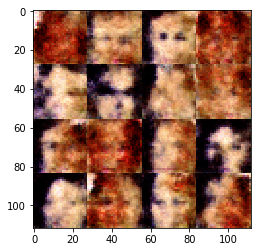

Epoch 1/1... Discriminator Loss: 0.5714... Generator Loss: 2.8322


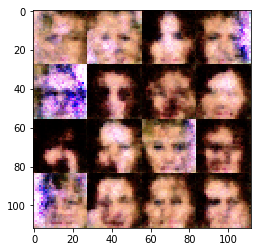

Epoch 1/1... Discriminator Loss: 0.6376... Generator Loss: 1.9093


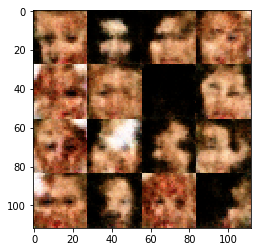

Epoch 1/1... Discriminator Loss: 0.4783... Generator Loss: 1.9514


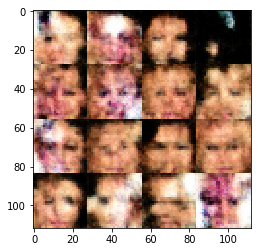

Epoch 1/1... Discriminator Loss: 0.5670... Generator Loss: 1.9824


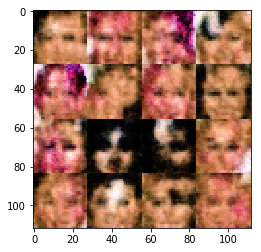

Epoch 1/1... Discriminator Loss: 0.6073... Generator Loss: 1.7656


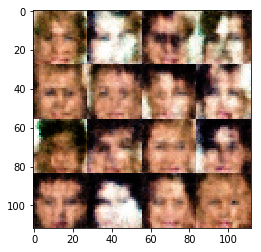

Epoch 1/1... Discriminator Loss: 0.5045... Generator Loss: 1.9995


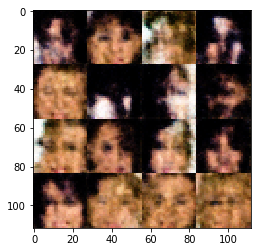

Epoch 1/1... Discriminator Loss: 0.5085... Generator Loss: 2.7513


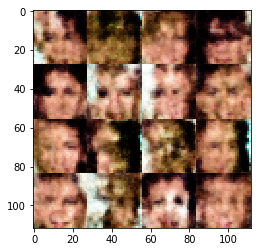

Epoch 1/1... Discriminator Loss: 0.5193... Generator Loss: 2.0081


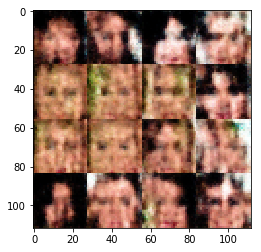

Epoch 1/1... Discriminator Loss: 0.4693... Generator Loss: 2.7948


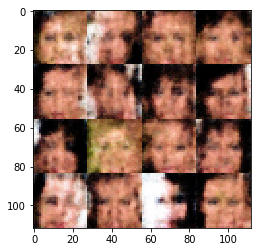

Epoch 1/1... Discriminator Loss: 0.4651... Generator Loss: 2.0440


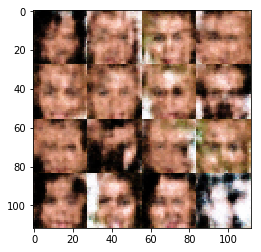

Epoch 1/1... Discriminator Loss: 0.5066... Generator Loss: 2.7652


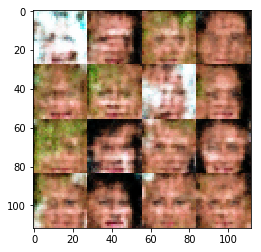

Epoch 1/1... Discriminator Loss: 0.4906... Generator Loss: 2.7964


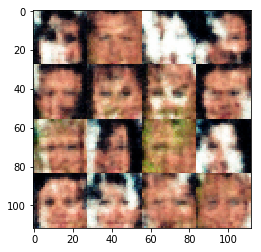

Epoch 1/1... Discriminator Loss: 0.5550... Generator Loss: 1.9842


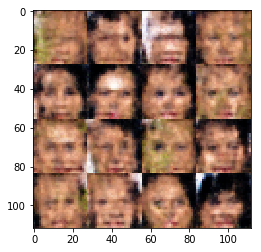

Epoch 1/1... Discriminator Loss: 0.4110... Generator Loss: 3.1486


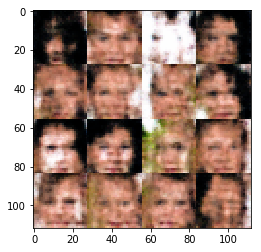

Epoch 1/1... Discriminator Loss: 0.3963... Generator Loss: 3.3411


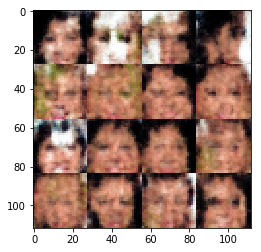

Epoch 1/1... Discriminator Loss: 0.4674... Generator Loss: 3.0026


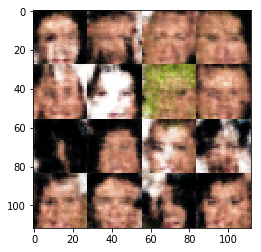

Epoch 1/1... Discriminator Loss: 0.4683... Generator Loss: 2.0782


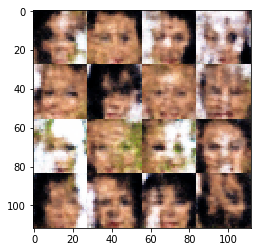

Epoch 1/1... Discriminator Loss: 0.5701... Generator Loss: 1.7574


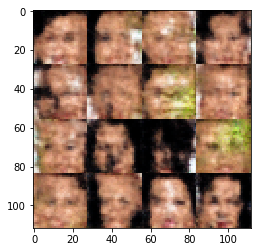

Epoch 1/1... Discriminator Loss: 0.4047... Generator Loss: 2.5254


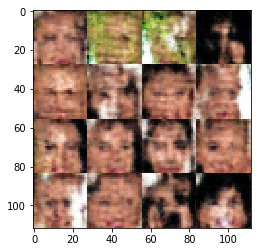

Epoch 1/1... Discriminator Loss: 0.4028... Generator Loss: 3.7508


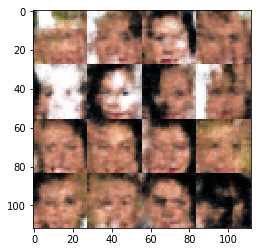

Epoch 1/1... Discriminator Loss: 0.4711... Generator Loss: 2.5269


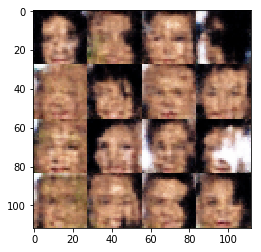

Epoch 1/1... Discriminator Loss: 0.4632... Generator Loss: 2.0615


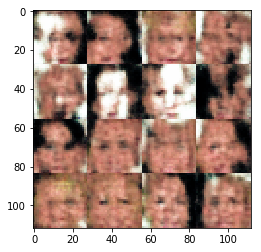

Epoch 1/1... Discriminator Loss: 0.4026... Generator Loss: 4.0163


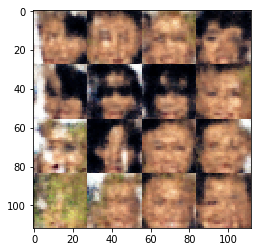

Epoch 1/1... Discriminator Loss: 0.4874... Generator Loss: 2.9906


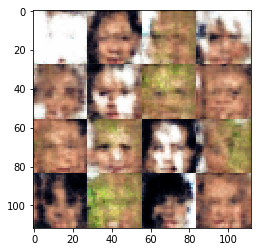

Epoch 1/1... Discriminator Loss: 0.4007... Generator Loss: 2.8189


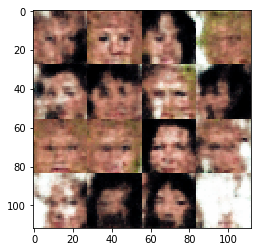

Epoch 1/1... Discriminator Loss: 0.4109... Generator Loss: 3.5130


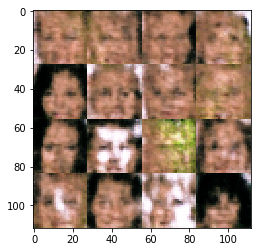

Epoch 1/1... Discriminator Loss: 0.5788... Generator Loss: 1.4534


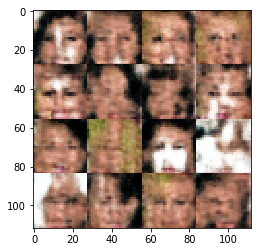

Epoch 1/1... Discriminator Loss: 0.4131... Generator Loss: 3.2485


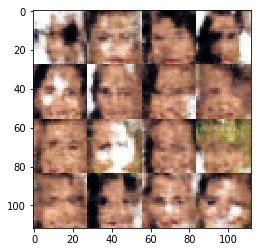

Epoch 1/1... Discriminator Loss: 0.3786... Generator Loss: 2.6990


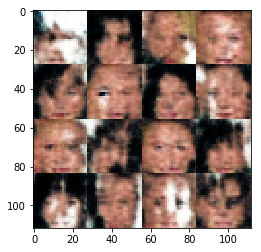

Epoch 1/1... Discriminator Loss: 0.9486... Generator Loss: 1.3718


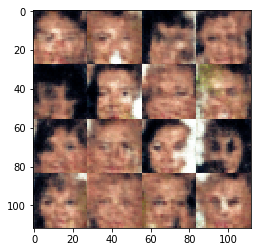

Epoch 1/1... Discriminator Loss: 0.3669... Generator Loss: 3.5461


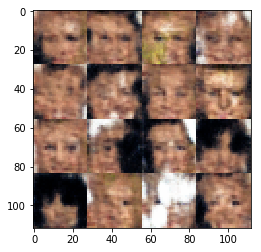

Epoch 1/1... Discriminator Loss: 0.3886... Generator Loss: 3.2322


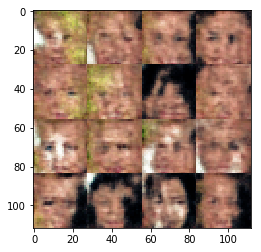

Epoch 1/1... Discriminator Loss: 0.3921... Generator Loss: 4.2178


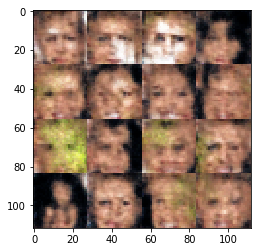

Epoch 1/1... Discriminator Loss: 0.3988... Generator Loss: 3.0278


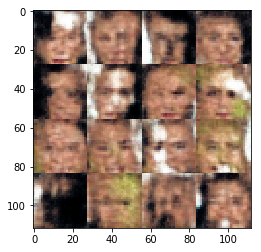

Epoch 1/1... Discriminator Loss: 0.3858... Generator Loss: 4.0115


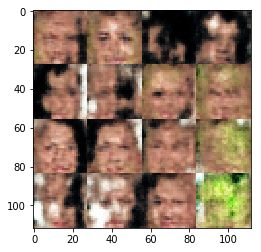

Epoch 1/1... Discriminator Loss: 0.4828... Generator Loss: 2.3315


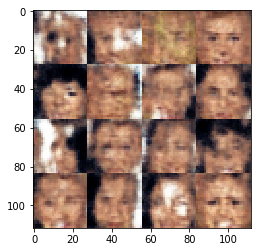

Epoch 1/1... Discriminator Loss: 0.3767... Generator Loss: 3.3227


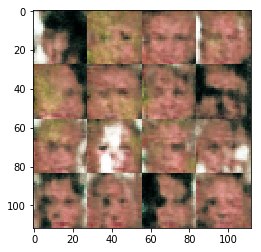

Epoch 1/1... Discriminator Loss: 0.4090... Generator Loss: 2.7292


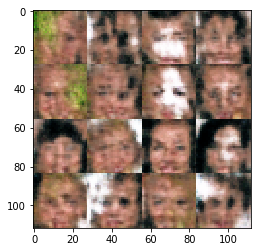

Epoch 1/1... Discriminator Loss: 0.4197... Generator Loss: 3.1733


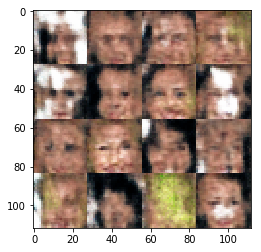

Epoch 1/1... Discriminator Loss: 0.3963... Generator Loss: 3.0726


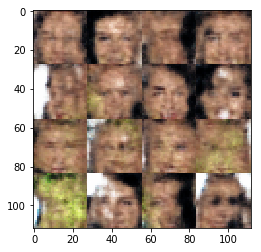

Epoch 1/1... Discriminator Loss: 0.3998... Generator Loss: 4.0895


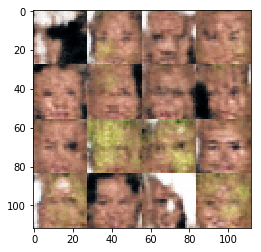

Epoch 1/1... Discriminator Loss: 0.3894... Generator Loss: 3.6967


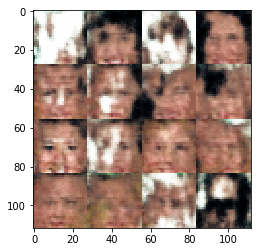

Epoch 1/1... Discriminator Loss: 0.5092... Generator Loss: 2.9817


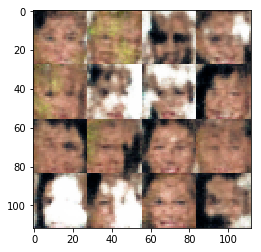

Epoch 1/1... Discriminator Loss: 0.4076... Generator Loss: 2.8024


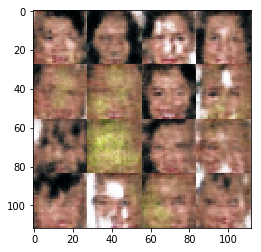

Epoch 1/1... Discriminator Loss: 0.3843... Generator Loss: 4.3749


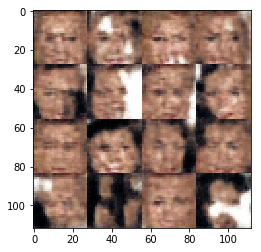

Epoch 1/1... Discriminator Loss: 0.4668... Generator Loss: 2.8144


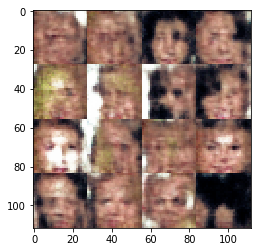

Epoch 1/1... Discriminator Loss: 0.3786... Generator Loss: 3.9219


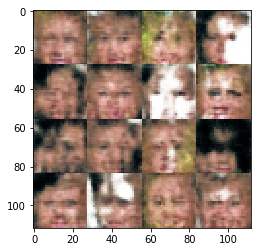

Epoch 1/1... Discriminator Loss: 0.4999... Generator Loss: 3.1309


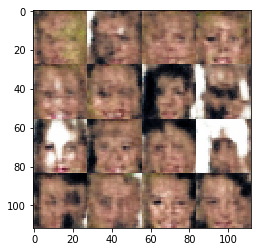

Epoch 1/1... Discriminator Loss: 0.4138... Generator Loss: 4.0040


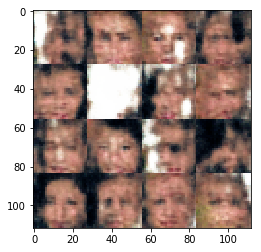

Epoch 1/1... Discriminator Loss: 0.3951... Generator Loss: 3.5851


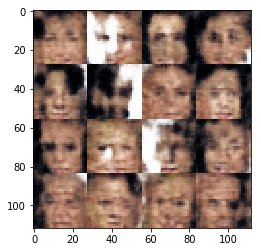

Epoch 1/1... Discriminator Loss: 0.3743... Generator Loss: 3.8145


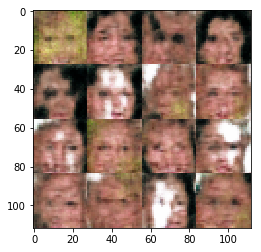

Epoch 1/1... Discriminator Loss: 0.3739... Generator Loss: 2.8607


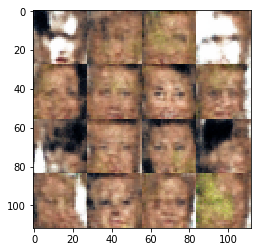

Epoch 1/1... Discriminator Loss: 0.5052... Generator Loss: 2.5629


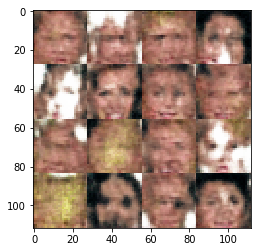

Epoch 1/1... Discriminator Loss: 0.3641... Generator Loss: 3.6289


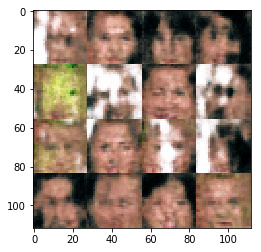

Epoch 1/1... Discriminator Loss: 0.4321... Generator Loss: 2.7315


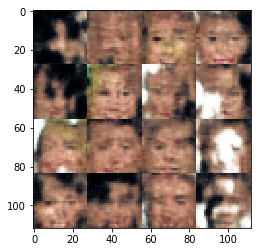

Epoch 1/1... Discriminator Loss: 0.3888... Generator Loss: 4.1272


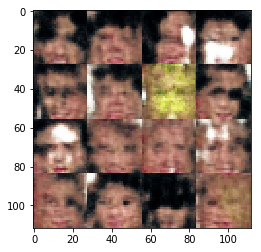

Epoch 1/1... Discriminator Loss: 0.3853... Generator Loss: 3.1082


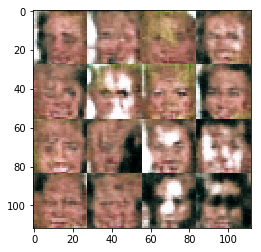

Epoch 1/1... Discriminator Loss: 0.4949... Generator Loss: 2.3677


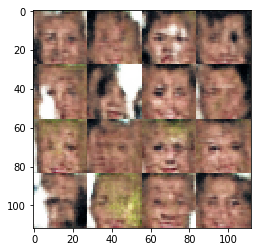

Epoch 1/1... Discriminator Loss: 0.4002... Generator Loss: 3.6454


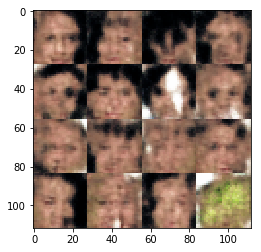

Epoch 1/1... Discriminator Loss: 0.3565... Generator Loss: 3.5845


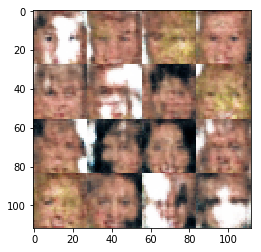

Epoch 1/1... Discriminator Loss: 0.3665... Generator Loss: 2.8851


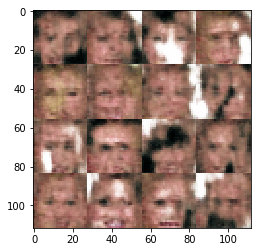

Epoch 1/1... Discriminator Loss: 0.3637... Generator Loss: 3.4078


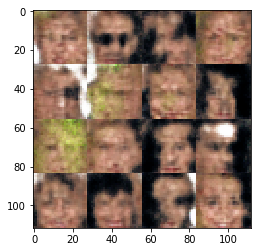

Epoch 1/1... Discriminator Loss: 0.4337... Generator Loss: 3.4982


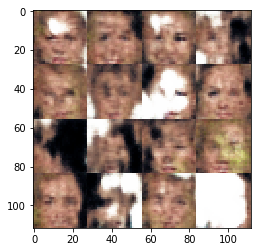

Epoch 1/1... Discriminator Loss: 0.3685... Generator Loss: 4.2278


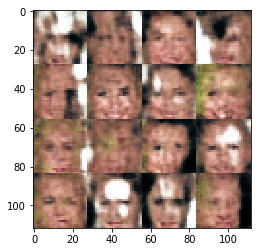

Epoch 1/1... Discriminator Loss: 0.3815... Generator Loss: 3.3161


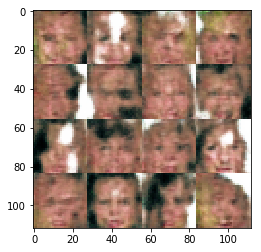

Epoch 1/1... Discriminator Loss: 0.3687... Generator Loss: 2.6308


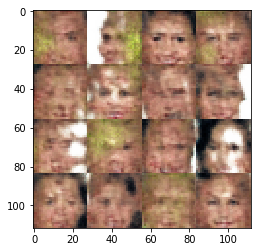

Epoch 1/1... Discriminator Loss: 0.3739... Generator Loss: 4.2000


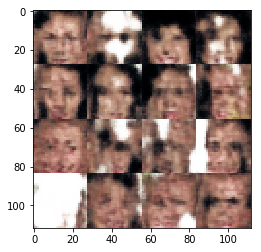

Epoch 1/1... Discriminator Loss: 0.3783... Generator Loss: 3.3077


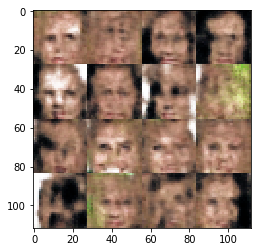

Epoch 1/1... Discriminator Loss: 0.3628... Generator Loss: 3.8121


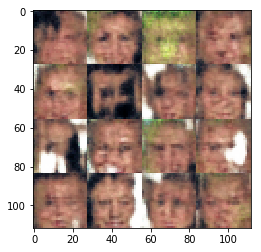

Epoch 1/1... Discriminator Loss: 0.3697... Generator Loss: 3.7384


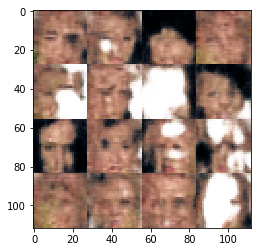

Epoch 1/1... Discriminator Loss: 0.4048... Generator Loss: 3.0315


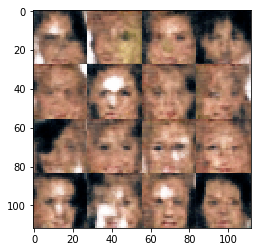

Epoch 1/1... Discriminator Loss: 0.4766... Generator Loss: 2.6460


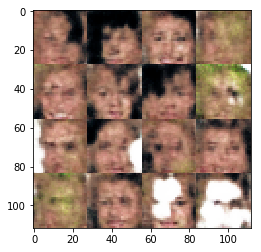

Epoch 1/1... Discriminator Loss: 0.3870... Generator Loss: 2.7997


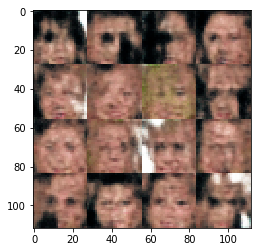

Epoch 1/1... Discriminator Loss: 0.4475... Generator Loss: 2.6575


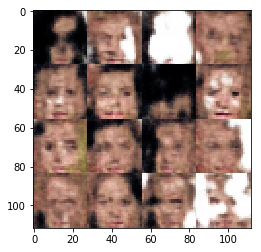

Epoch 1/1... Discriminator Loss: 0.3775... Generator Loss: 3.8798


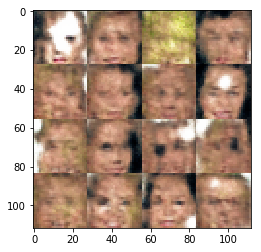

Epoch 1/1... Discriminator Loss: 0.4044... Generator Loss: 3.5187


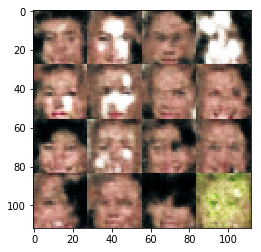

Epoch 1/1... Discriminator Loss: 0.3531... Generator Loss: 3.9193


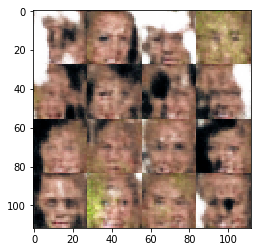

Epoch 1/1... Discriminator Loss: 0.3563... Generator Loss: 4.0188


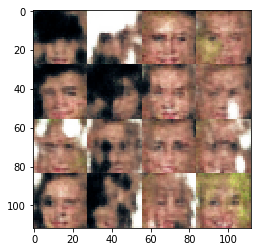

Epoch 1/1... Discriminator Loss: 0.3555... Generator Loss: 3.2366


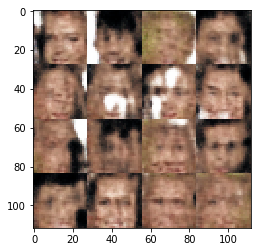

Epoch 1/1... Discriminator Loss: 0.3625... Generator Loss: 3.3699


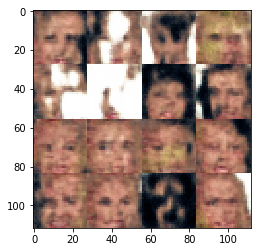

Epoch 1/1... Discriminator Loss: 0.3494... Generator Loss: 4.7488


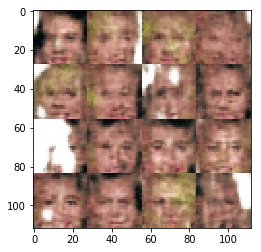

Epoch 1/1... Discriminator Loss: 0.3835... Generator Loss: 2.8503


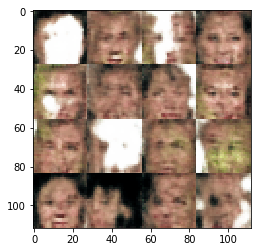

Epoch 1/1... Discriminator Loss: 0.3641... Generator Loss: 4.1696


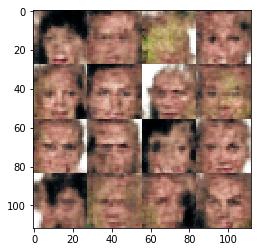

Epoch 1/1... Discriminator Loss: 0.3806... Generator Loss: 3.5451


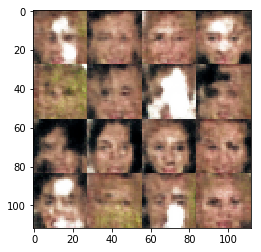

Epoch 1/1... Discriminator Loss: 0.3764... Generator Loss: 3.8909


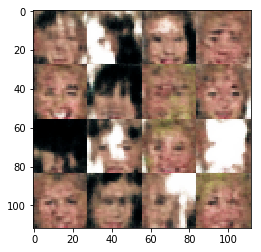

Epoch 1/1... Discriminator Loss: 0.3879... Generator Loss: 3.1368


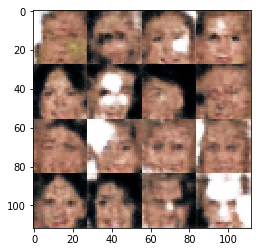

Epoch 1/1... Discriminator Loss: 0.3996... Generator Loss: 2.5937


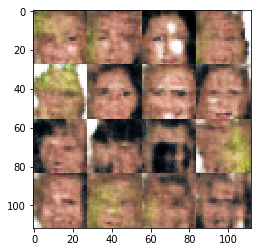

Epoch 1/1... Discriminator Loss: 0.5360... Generator Loss: 3.9658


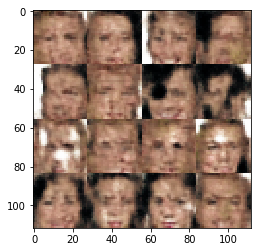

Epoch 1/1... Discriminator Loss: 0.3574... Generator Loss: 4.2957


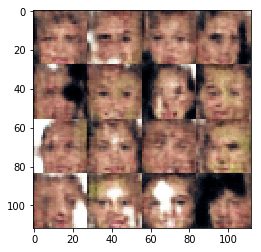

Epoch 1/1... Discriminator Loss: 0.3594... Generator Loss: 4.4056


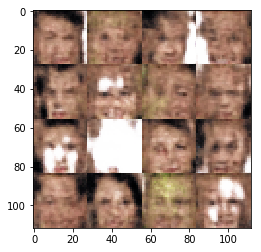

Epoch 1/1... Discriminator Loss: 0.4357... Generator Loss: 3.2664


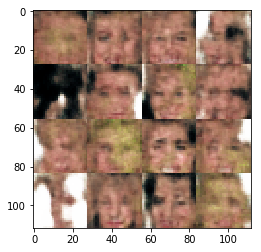

Epoch 1/1... Discriminator Loss: 0.3784... Generator Loss: 3.2066


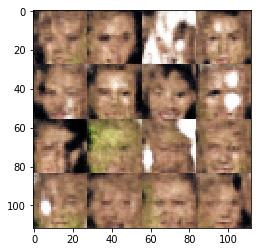

Epoch 1/1... Discriminator Loss: 0.3726... Generator Loss: 3.0332


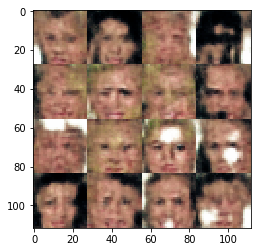

Epoch 1/1... Discriminator Loss: 0.3920... Generator Loss: 3.4163


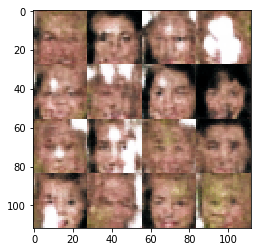

Epoch 1/1... Discriminator Loss: 0.3580... Generator Loss: 4.1274


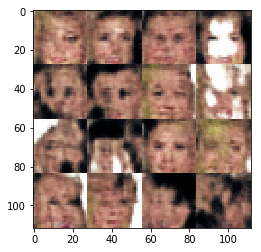

Epoch 1/1... Discriminator Loss: 0.3643... Generator Loss: 3.0433


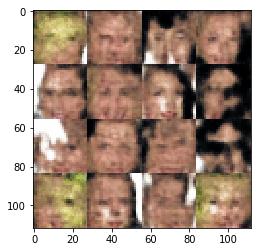

Epoch 1/1... Discriminator Loss: 0.3774... Generator Loss: 3.2297


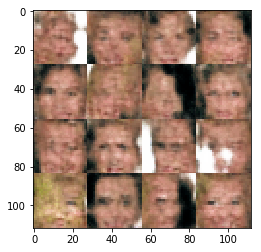

Epoch 1/1... Discriminator Loss: 0.3826... Generator Loss: 2.9358


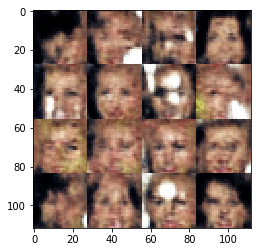

Epoch 1/1... Discriminator Loss: 0.3651... Generator Loss: 4.2410


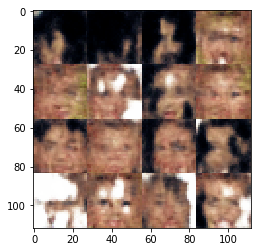

Epoch 1/1... Discriminator Loss: 0.3648... Generator Loss: 3.8293


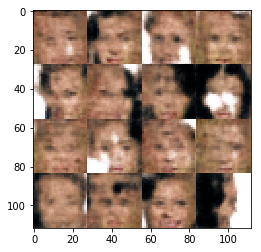

Epoch 1/1... Discriminator Loss: 0.3632... Generator Loss: 3.3579


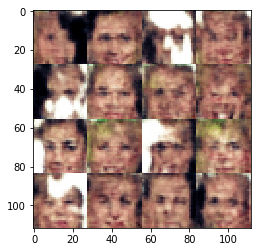

Epoch 1/1... Discriminator Loss: 0.3570... Generator Loss: 4.4127


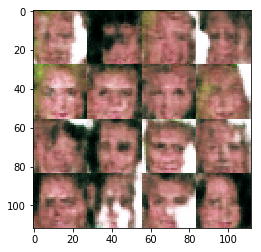

Epoch 1/1... Discriminator Loss: 0.3745... Generator Loss: 3.1379


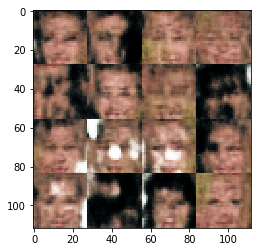

Epoch 1/1... Discriminator Loss: 0.3830... Generator Loss: 3.0334


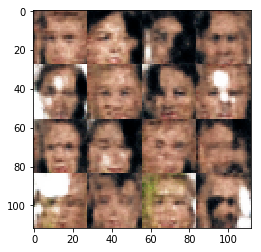

Epoch 1/1... Discriminator Loss: 0.3807... Generator Loss: 3.5997


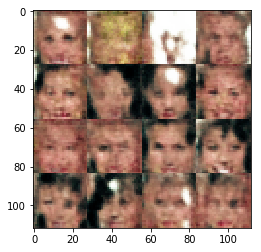

In [28]:
batch_size = 16
z_dim = 100
learning_rate = 0.00025
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.